Please refer to the Table of Contents sa gilid ty

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import imutils
import cv2
from google.colab.patches import cv2_imshow

# Image Registration using ORB

In [ ]:
# Image alignment using ORB
# Ref: https://pyimagesearch.com/2020/08/31/image-alignment-and-registration-with-opencv/

def align_images(image, template, maxFeatures=500, keepPercent=0.2, debug=False):
    # Convert both the input image and template to grayscale
    if len(image.shape) == 3:
        imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        imageGray = image

    if len(template.shape) == 3:
        templateGray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
    else:
        templateGray = template

    # Use ORB to detect keypoints and extract (binary) local invariant features
    orb = cv2.ORB_create(maxFeatures)
    (kpsA, descsA) = orb.detectAndCompute(imageGray, None)
    (kpsB, descsB) = orb.detectAndCompute(templateGray, None)

    # Match the features
    method = cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING
    matcher = cv2.DescriptorMatcher_create(method)
    matches = matcher.match(descsA, descsB, None)

    # Sort the matches by their distance (the smaller the distance, the "more similar" the features are)
    matches = sorted(matches, key=lambda x: x.distance)

    # Keep only the top matches
    keep = int(len(matches) * keepPercent)
    matches = matches[:keep]

    # Check to see if we should visualize the matched keypoints
    if debug:
        matchedVis = cv2.drawMatches(image, kpsA, template, kpsB, matches, None)
        matchedVis = imutils.resize(matchedVis, width=1000)
        cv2_imshow(matchedVis)

    # Allocate memory for the keypoints (x, y)-coordinates from the top matches
    # We'll use these coordinates to compute our homography matrix
    ptsA = np.zeros((len(matches), 2), dtype="float")
    ptsB = np.zeros((len(matches), 2), dtype="float")

    # Loop over the top matches
    for (i, m) in enumerate(matches):
        # Indicate that the two keypoints in the respective images map to each other
        ptsA[i] = kpsA[m.queryIdx].pt
        ptsB[i] = kpsB[m.trainIdx].pt

    # Compute the homography matrix between the two sets of matched points
    (H, mask) = cv2.findHomography(ptsA, ptsB, method=cv2.RANSAC)

    # Use the homography matrix to align the images
    (h, w) = template.shape[:2]
    aligned = cv2.warpPerspective(image, H, (w, h))

    # Return the aligned image
    return aligned


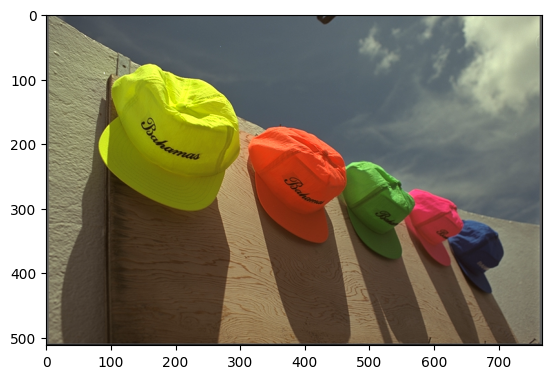

In [ ]:
test_img = np.asarray(Image.open('/content/KODAK test.png'))
plt.imshow(test_img)

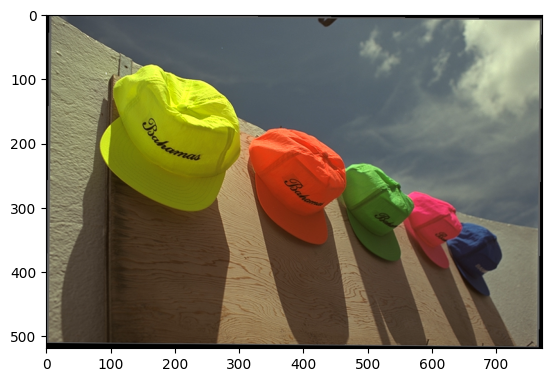

In [ ]:
from scipy import ndimage

#rotation angle in degree
rotated = ndimage.rotate(test_img, -0.5)
plt.imshow(rotated)

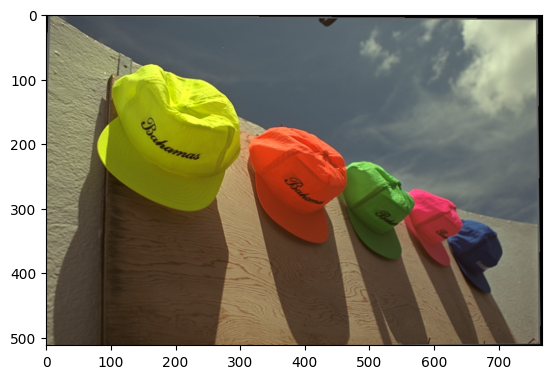

In [ ]:
fixed = align_images(rotated, test_img)
plt.imshow(fixed)

# Template Class Object

In [ ]:
class Template:
    def __init__(self, image_paths, a=1, b=1):
        # Load all images and convert them to numpy arrays
        images = [np.array(Image.open(img).convert("L"), dtype=np.float32) for img in image_paths]

        # Calculate mean image
        self.image = np.mean(images, axis=0)

        # Calculate standard deviation
        self.std = np.std(images, axis=0)

        # Set empirical values a and b
        self.a = a
        self.b = b

        # Calculate self.light using the formula: Ia(x,y) + max(a, b * std(x,y))
        self.light = np.clip(self.image + np.maximum(self.a, self.b * self.std), 0, 255)

        # Calculate self.dark using the formula: Ia(x,y) - max(a, b * std(x,y))
        self.dark = np.clip(self.image - np.maximum(self.a, self.b * self.std), 0, 255)

    def get_template_image(self):
        return Image.fromarray(self.image.astype(np.uint8))

    def get_light_image(self):
        return Image.fromarray(self.light.astype(np.uint8))

    def get_dark_image(self):
        return Image.fromarray(self.dark.astype(np.uint8))

# Example usage (assuming we have a list of image file paths):
# image_paths = ['image1.jpg', 'image2.jpg', 'image3.jpg']
# template = Template(image_paths, a=2, b=1)
# mean_image = template.get_template_image()
# mean_image.show()

# Light Standard Dark

Text(0.5, 1.0, 'Dark')

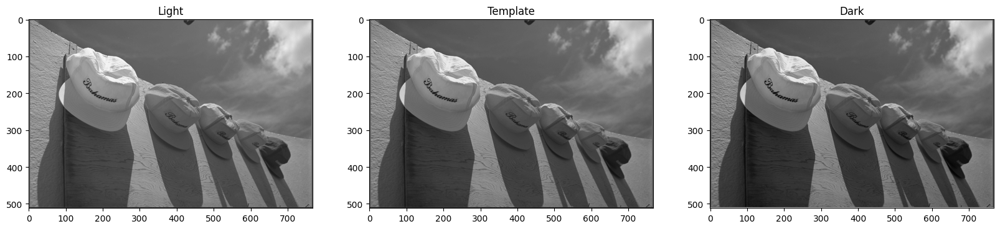

In [ ]:
image_paths = ['/content/KODAK test.png']
golden_image = Template(image_paths, a=10, b=50)

plt.figure(figsize=(20,10))

plt.subplot(1,3,1)
plt.imshow(golden_image.get_light_image(), cmap='gray')
plt.title("Light")

plt.subplot(1,3,2)
plt.imshow(golden_image.get_template_image(), cmap='gray')
plt.title("Template")

plt.subplot(1,3,3)
plt.imshow(golden_image.get_dark_image(), cmap='gray')
plt.title("Dark")

# Version 1.0

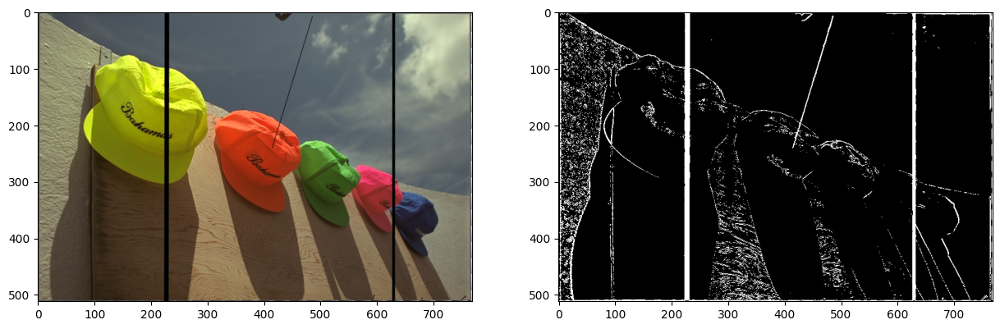

In [ ]:
# Algorithm v1.0
# Changes: Using LSD, comparing each pixel value to determine if it falls within range, if not, defective pixel
# Problems: Super madami artifacts and false positives

sample = np.asarray(Image.open('/content/KODAK defect 2.png'))
rotated = ndimage.rotate(sample, -2)
fixed = align_images(rotated, np.asarray(golden_image.get_template_image()))

sample_image_gray = np.array(Image.fromarray(fixed).convert("L"), dtype=np.float32)

sample_image_rgb = np.array(Image.fromarray(fixed).convert("RGB"), dtype=np.uint8)

# Find the pixels that are not within the threshold range
out_of_range = np.logical_or(sample_image_gray < golden_image.dark, sample_image_gray > golden_image.light)

# Mark the out-of-range pixels in red
sample_image_rgb[out_of_range] = [255, 0, 0]  # Set out-of-range pixels to red

binary_defect_image = np.zeros_like(sample_image_gray, dtype=np.uint8)
binary_defect_image[out_of_range == 1] = 255  # Set defective pixels to white

# Convert the binary mask to an image
binary_image = Image.fromarray(binary_defect_image)

plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.imshow(fixed)

plt.subplot(1,2,2)
plt.imshow(binary_image, cmap='gray')

# Version 1.1

In [ ]:
# Algorithm v1.1
# Changes: Gumamit ng kernel with Gaussian blur to generalize the image, and used morpological algo para maremmove yung mga isolated false positives (noise)
# Problems: contour artifacting, even with subtle rotation andami artifacts na nilalabas

def get_marked_image(image_path, kernel_size, rotation=-0.5, ideal=True):
  sample = np.asarray(Image.open(image_path))
  if ideal == True:
    fixed = sample
  else:
    rotated = ndimage.rotate(sample, rotation)
    fixed = align_images(rotated, np.asarray(golden_image.get_template_image()))

  # Load and convert sample image to grayscale
  sample_image_gray = np.array(Image.fromarray(fixed).convert("L"), dtype=np.float32)

  # Convert the grayscale sample image to RGB to allow color marking
  sample_image_rgb = np.array(Image.fromarray(fixed).convert("RGB"), dtype=np.uint8)

  # Apply Gaussian blur to reduce false positives (blur sample, dark, and light images)
  sample_image_blur = cv2.GaussianBlur(sample_image_gray, (kernel_size, kernel_size), 0)
  dark_blur = cv2.GaussianBlur(golden_image.dark, (kernel_size, kernel_size), 0)
  light_blur = cv2.GaussianBlur(golden_image.light, (kernel_size, kernel_size), 0)

  # Find the pixels that are not within the threshold range
  out_of_range = np.logical_or(sample_image_blur < dark_blur, sample_image_blur > light_blur)

  # Optionally: Apply morphological operations to refine the result (remove isolated noise)
  out_of_range = cv2.morphologyEx(out_of_range.astype(np.uint8), cv2.MORPH_OPEN, np.ones((3, 3), np.uint8))

  # Create a binary mask where defective pixels are white (255) and others are black (0)
  binary_defect_image = np.zeros_like(sample_image_gray, dtype=np.uint8)
  binary_defect_image[out_of_range == 1] = 255  # Set defective pixels to white

  # Convert the binary mask to an image
  binary_image = Image.fromarray(binary_defect_image)

  return binary_image

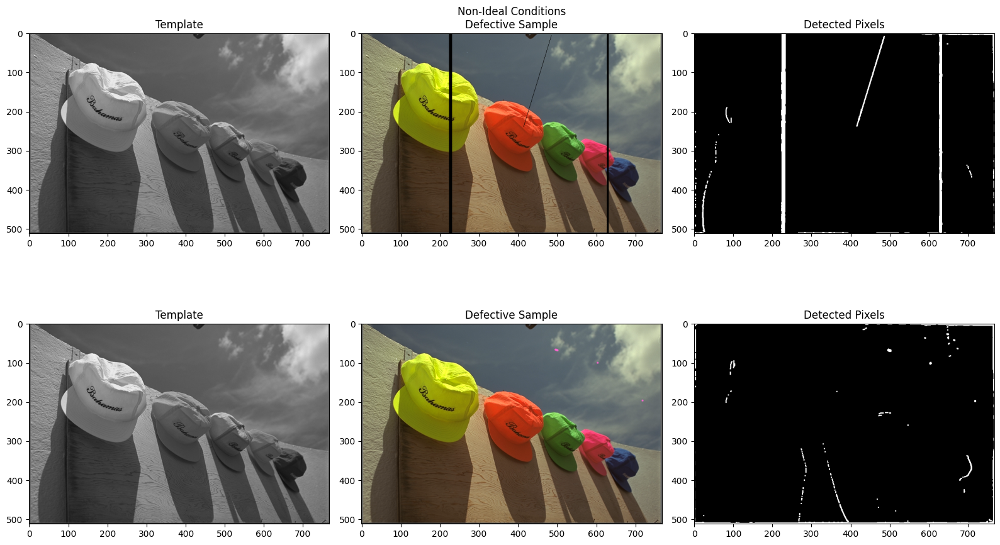

In [ ]:
defect1 = '/content/KODAK defect 2.png'
defect2 = '/content/KODAK defect 3.png'

defect1_img = Image.open(defect1)
defect2_img = Image.open(defect2)
marked_defect1 = get_marked_image(defect1, kernel_size=5,ideal=False, rotation=-2)
marked_defect2 = get_marked_image(defect2, kernel_size=5,ideal=False, rotation=-2)

plt.figure(figsize=(16,10))

plt.subplot(2,3,1)
plt.imshow(golden_image.get_template_image().convert("RGB"))
plt.title("Template")

plt.subplot(2,3,2)
plt.imshow(defect1_img)
plt.title("Non-Ideal Conditions\nDefective Sample")

plt.subplot(2,3,3)
plt.imshow(marked_defect1, cmap="gray")
plt.title("Detected Pixels")

plt.subplot(2,3,4)
plt.imshow(golden_image.get_template_image().convert("RGB"))
plt.title("Template")

plt.subplot(2,3,5)
plt.imshow(defect2_img)
plt.title("Defective Sample")

plt.subplot(2,3,6)
plt.imshow(marked_defect2, cmap="gray")
plt.title("Detected Pixels")

plt.tight_layout()
plt.show()

# Version 1.2

In [ ]:
# Algorithm v1.2
# Changes: Make use of the Two-Way Image Difference algorithm from this
# https://ieeexplore.ieee.org/abstract/document/6223405/figures#figures
#
# Problems: Countour artifacting is still apparent, but is lessened from v1.1. However, this
# approach removed the Light Standard Dark criteria in favor for the Two-Way image difference.

def get_marked_image(image_path, kernel_size, rotation, ideal=True):
    sample = np.asarray(Image.open(image_path))
    if ideal:
        fixed = sample
    else:
        rotated = ndimage.rotate(sample, rotation)
        fixed = align_images(rotated, np.asarray(golden_image.get_template_image()))

    # Convert images to grayscale
    sample_image_gray = np.array(Image.fromarray(fixed).convert("L"), dtype=np.float32)
    # Get the template image and check if it's already in grayscale
    template_image_gray = np.array(golden_image.get_template_image())

    # Gaussian blurs for the two images to reduce noise
    sample_image_blur = cv2.GaussianBlur(sample_image_gray, (kernel_size, kernel_size), 0)
    template_image_blur = cv2.GaussianBlur(template_image_gray, (kernel_size, kernel_size), 0)

    # Initialize the difference maps
    height, width = sample_image_gray.shape
    diff1 = np.zeros_like(sample_image_gray, dtype=np.float32)
    diff2 = np.zeros_like(sample_image_gray, dtype=np.float32)

    # Calculate Dim(x, y) and Dim'(x, y) for each pixel using a 3x3 neighborhood
    for i in range(3, height - 3):
        for j in range(3, width - 3):
            # Template vs. Sample neighborhood
            neighborhood_sample = sample_image_blur[i-1:i+2, j-1:j+2]
            diff1[i, j] = np.abs(template_image_blur[i, j] - neighborhood_sample).min()

            # Sample vs. Template neighborhood
            neighborhood_template = template_image_blur[i-1:i+2, j-1:j+2]
            diff2[i, j] = np.abs(sample_image_blur[i, j] - neighborhood_template).min()

    # Take the maximum of the two difference maps
    final_diff = np.maximum(diff1, diff2)

    # Thresholding the final difference to create a binary defect mask
    threshold = np.mean(final_diff) + 2 * np.std(final_diff)  # Adjust threshold as needed
    binary_defect_image = np.where(final_diff > threshold, 255, 0).astype(np.uint8)

    # Convert binary mask to image
    binary_image = Image.fromarray(binary_defect_image)

    return binary_image

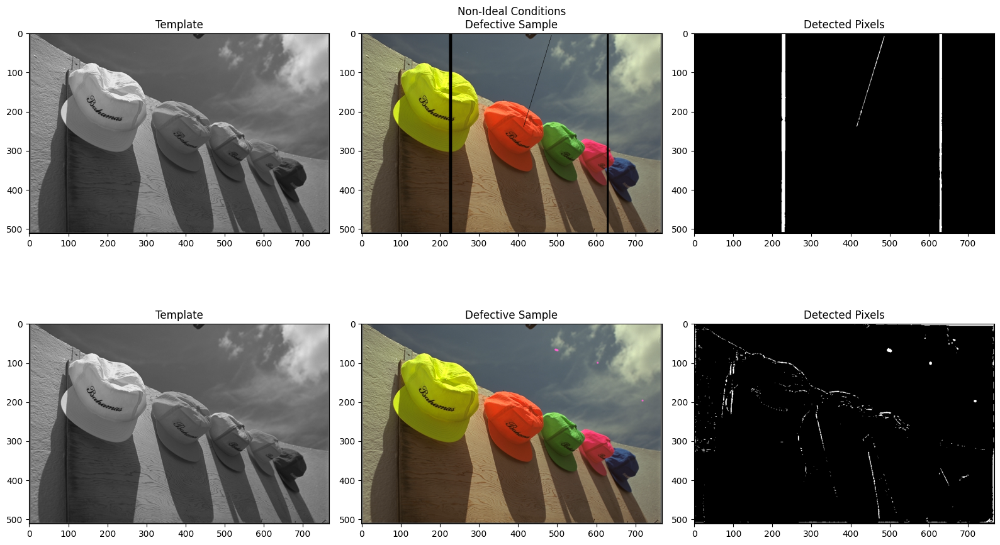

In [ ]:
defect1 = '/content/KODAK defect 2.png'
defect2 = '/content/KODAK defect 3.png'

defect1_img = Image.open(defect1)
defect2_img = Image.open(defect2)
marked_defect1 = get_marked_image(defect1, kernel_size=5,ideal=False, rotation=-2)
marked_defect2 = get_marked_image(defect2, kernel_size=5,ideal=False, rotation=-2)

plt.figure(figsize=(16,10))

plt.subplot(2,3,1)
plt.imshow(golden_image.get_template_image().convert("RGB"))
plt.title("Template")

plt.subplot(2,3,2)
plt.imshow(defect1_img)
plt.title("Non-Ideal Conditions\nDefective Sample")

plt.subplot(2,3,3)
plt.imshow(marked_defect1, cmap="gray")
plt.title("Detected Pixels")

plt.subplot(2,3,4)
plt.imshow(golden_image.get_template_image().convert("RGB"))
plt.title("Template")

plt.subplot(2,3,5)
plt.imshow(defect2_img)
plt.title("Defective Sample")

plt.subplot(2,3,6)
plt.imshow(marked_defect2, cmap="gray")
plt.title("Detected Pixels")

plt.tight_layout()
plt.show()

# Version 1.3

In [ ]:
# Version 1.3
# Changes: Integrate both v1.1 and v1.2, combining both Two-Way image difference and
# light standard dark criteria
# Problems: does not work

def get_marked_image(image_path, kernel_size, rotation, ideal=True):
    sample = np.asarray(Image.open(image_path))

    # If ideal alignment isn't guaranteed, rotate the image slightly
    if ideal:
        fixed = sample
    else:
        rotated = ndimage.rotate(sample, rotation)
        fixed = align_images(rotated, np.asarray(golden_image.get_template_image()))

    # Convert both sample and template to grayscale
    sample_image_gray = np.array(Image.fromarray(fixed).convert("L"), dtype=np.float32)
    template_image_gray = np.array(golden_image.image, dtype=np.float32)

    # Apply Gaussian blur to both images to reduce noise
    sample_image_blur = cv2.GaussianBlur(sample_image_gray, (kernel_size, kernel_size), 0)
    template_image_blur = cv2.GaussianBlur(template_image_gray, (kernel_size, kernel_size), 0)

    # Initialize two-way difference maps
    height, width = sample_image_gray.shape
    diff1 = np.zeros_like(sample_image_gray, dtype=np.float32)
    diff2 = np.zeros_like(sample_image_gray, dtype=np.float32)

    # Perform two-way image difference calculation
    for i in range(3, height - 3):
        for j in range(3, width - 3):
            # Template vs. Sample neighborhood
            neighborhood_sample = sample_image_blur[i-1:i+2, j-1:j+2]
            diff1[i, j] = np.abs(template_image_blur[i, j] - neighborhood_sample).min()

            # Sample vs. Template neighborhood
            neighborhood_template = template_image_blur[i-1:i+2, j-1:j+2]
            diff2[i, j] = np.abs(sample_image_blur[i, j] - neighborhood_template).min()

    # Combine two-way differences into a final difference map
    final_diff = np.maximum(diff1, diff2)

    # Use light and dark thresholds from the Template class
    out_of_range = np.logical_or(
        final_diff > golden_image.light,
        final_diff < golden_image.dark
    )

    # Clean up isolated noise with morphological opening
    out_of_range = cv2.morphologyEx(out_of_range.astype(np.uint8), cv2.MORPH_OPEN, np.ones((3, 3), np.uint8))

    # Create a binary mask for defects
    binary_defect_image = np.zeros_like(sample_image_gray, dtype=np.uint8)
    binary_defect_image[out_of_range == 1] = 255

    # Convert the binary mask to an image
    binary_image = Image.fromarray(binary_defect_image)

    return binary_image

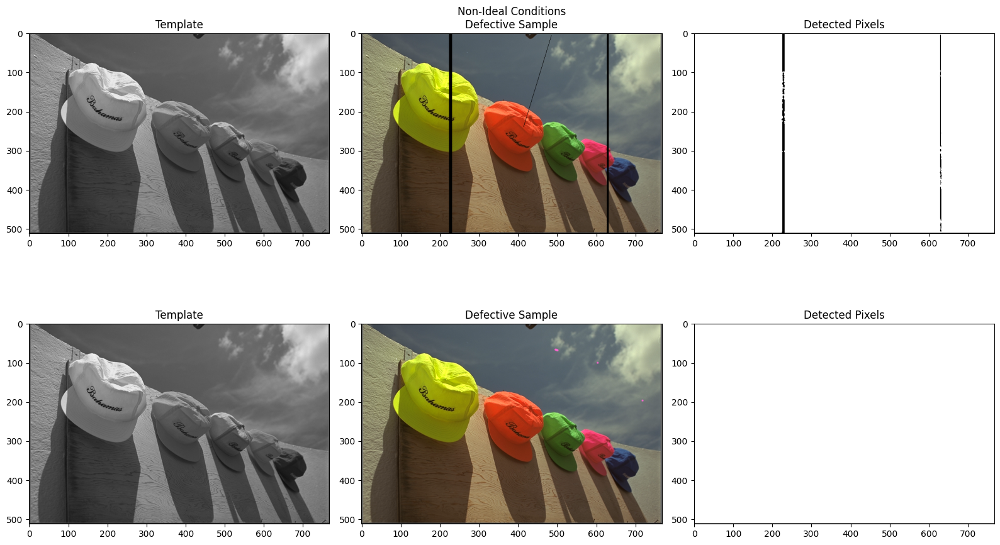

In [ ]:
defect1 = '/content/KODAK defect 2.png'
defect2 = '/content/KODAK defect 3.png'

defect1_img = Image.open(defect1)
defect2_img = Image.open(defect2)
marked_defect1 = get_marked_image(defect1, kernel_size=5,ideal=False, rotation=0)
marked_defect2 = get_marked_image(defect2, kernel_size=5,ideal=False, rotation=0)

plt.figure(figsize=(16,10))

plt.subplot(2,3,1)
plt.imshow(golden_image.get_template_image().convert("RGB"))
plt.title("Template")

plt.subplot(2,3,2)
plt.imshow(defect1_img)
plt.title("Non-Ideal Conditions\nDefective Sample")

plt.subplot(2,3,3)
plt.imshow(marked_defect1, cmap="gray")
plt.title("Detected Pixels")

plt.subplot(2,3,4)
plt.imshow(golden_image.get_template_image().convert("RGB"))
plt.title("Template")

plt.subplot(2,3,5)
plt.imshow(defect2_img)
plt.title("Defective Sample")

plt.subplot(2,3,6)
plt.imshow(marked_defect2, cmap="gray")
plt.title("Detected Pixels")

plt.tight_layout()
plt.show()

# Version 1.4

In [ ]:
# Version 1.4
# Changes: Revisit v1.1 and instead implemented erosion and dilation utilizing a 3x3 grid
# Problems: Inconsistent results when changing rotations, for some reason, -2 is better than -0.5?
# TODO:
# - Change the image registration algorithm, as it might be the root cause of the variances

def get_marked_image(image_path, kernel_size, rotation=(-0.5), ideal=True):
    sample = np.asarray(Image.open(image_path))

    # Rotate and align the sample image if necessary
    if ideal:
        fixed = sample
    else:
        rotated = ndimage.rotate(sample, rotation)
        fixed = align_images(rotated, np.asarray(golden_image.get_template_image()))

    # Load and convert sample image to grayscale
    sample_image_gray = np.array(Image.fromarray(fixed).convert("L"), dtype=np.float32)

    # Apply Gaussian blur to reduce noise
    sample_image_blur = cv2.GaussianBlur(sample_image_gray, (kernel_size, kernel_size), 0)

    # Create blurred versions of the light and dark images
    dark_blur = cv2.GaussianBlur(golden_image.dark, (kernel_size, kernel_size), 0)
    light_blur = cv2.GaussianBlur(golden_image.light, (kernel_size, kernel_size), 0)

    # Apply morphological operations: dilation on light image and erosion on dark image
    light_dilated = cv2.dilate(light_blur, np.ones((3, 3), np.uint8))
    dark_eroded = cv2.erode(dark_blur, np.ones((3, 3), np.uint8))

    # Find the pixels that are not within the threshold range using dilated light and eroded dark images
    out_of_range = np.logical_or(sample_image_blur < dark_eroded, sample_image_blur > light_dilated)

    # Optionally: Apply morphological operations to refine the result (remove isolated noise)
    out_of_range = cv2.morphologyEx(out_of_range.astype(np.uint8), cv2.MORPH_OPEN, np.ones((3, 3), np.uint8))

    # Create a binary mask where defective pixels are white (255) and others are black (0)
    binary_defect_image = np.zeros_like(sample_image_gray, dtype=np.uint8)
    binary_defect_image[out_of_range == 1] = 255  # Set defective pixels to white

    # Convert the binary mask to an image
    binary_image = Image.fromarray(binary_defect_image)

    return binary_image

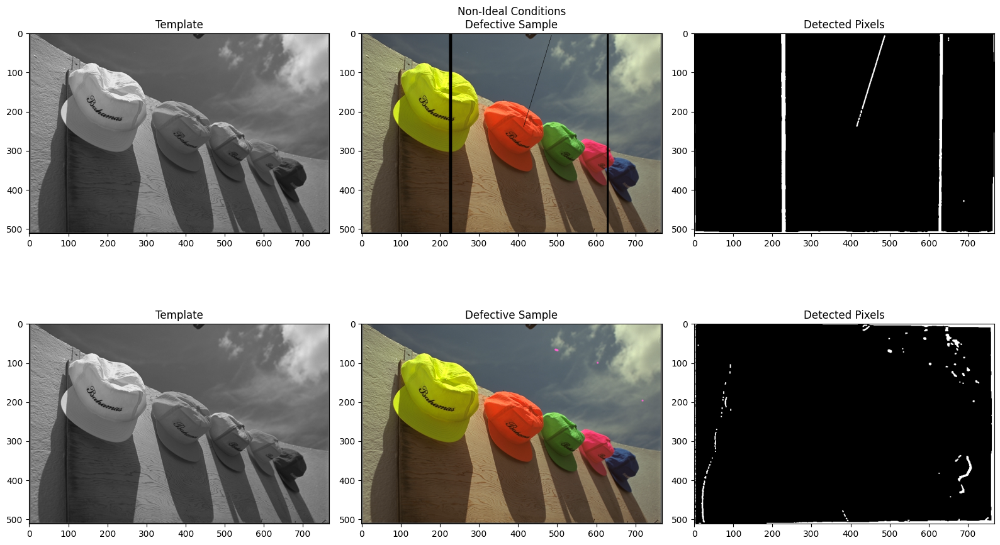

In [ ]:
defect1 = '/content/KODAK defect 2.png'
defect2 = '/content/KODAK defect 3.png'

defect1_img = Image.open(defect1)
defect2_img = Image.open(defect2)
marked_defect1 = get_marked_image(defect1, kernel_size=5,ideal=False, rotation=-0.5)
marked_defect2 = get_marked_image(defect2, kernel_size=5,ideal=False, rotation=-0.5)

plt.figure(figsize=(16,10))

plt.subplot(2,3,1)
plt.imshow(golden_image.get_template_image().convert("RGB"))
plt.title("Template")

plt.subplot(2,3,2)
plt.imshow(defect1_img)
plt.title("Non-Ideal Conditions\nDefective Sample")

plt.subplot(2,3,3)
plt.imshow(marked_defect1, cmap="gray")
plt.title("Detected Pixels")

plt.subplot(2,3,4)
plt.imshow(golden_image.get_template_image().convert("RGB"))
plt.title("Template")

plt.subplot(2,3,5)
plt.imshow(defect2_img)
plt.title("Defective Sample")

plt.subplot(2,3,6)
plt.imshow(marked_defect2, cmap="gray")
plt.title("Detected Pixels")

plt.tight_layout()
plt.show()

# Redoing the Registration Algorithm

## Image Registration Based on Shape Context with Concave-Convex Feature

In [ ]:
# Reference: https://www.mdpi.com/2076-3417/9/17/3598
# Section 2.2: Image Registration Based on Shape Context with Concave-Convex Feature

import numpy as np
import cv2
from scipy.ndimage import rotate
from skimage.measure import find_contours
from skimage import img_as_ubyte

def compute_shape_context(contours):
    hist = np.zeros((72,), dtype=int)
    # Center of the shape
    center = np.mean(contours, axis=0)

    for p in contours:
        # Calculate d_i, q_i, and θ_i
        d_i = np.linalg.norm(p - center)
        q_i = 1 if p[1] >= center[1] and p[0] < center[0] else 2 if p[1] >= center[1] else 3 if p[1] < center[1] and p[0] < center[0] else 4
        # θ_i can be calculated based on the adjacent points
        idx = np.where(contours == p)[0][0]
        if idx > 0 and idx < len(contours) - 1:
            prev = contours[idx - 1]
            next = contours[idx + 1]
            theta_i = np.arctan2(next[1] - prev[1], next[0] - prev[0])  # angle between adjacent points
        else:
            theta_i = 0

        # Quantize the values
        d_quant = min(2, int(d_i // (np.max(d_i) / 3)))  # Trisection
        theta_quant = min(5, int(theta_i // (np.pi / 6)))  # 6 segments

        # Update histogram
        hist[d_quant * 12 + (q_i - 1) * 6 + theta_quant] += 1  # 3x4x6

    return hist

def similarity_measure(hist_p, hist_q):
    return 0.5 * np.sum(((hist_p - hist_q) ** 2) / (hist_p + hist_q + 1e-6))  # Avoid division by zero

def register_images(sample_image, template_image):
    # Convert images to grayscale
    if len(sample_image.shape) == 3:
        sample_gray = cv2.cvtColor(sample_image, cv2.COLOR_BGR2GRAY)
    else:
        sample_gray = sample_image

    if len(template_image.shape) == 3:
        template_gray = cv2.cvtColor(template_image, cv2.COLOR_BGR2GRAY)
    else:
        template_gray = template_image

    # Find contours
    contours_sample = find_contours(sample_gray, level=0.5)
    contours_template = find_contours(template_gray, level=0.5)

    # Compute shape contexts
    hist_sample = compute_shape_context(contours_sample[0])
    hist_template = compute_shape_context(contours_template[0])

    # Compute similarity
    sim = similarity_measure(hist_sample, hist_template)

    # (Optional) Compute rotation and translation if needed
    # This part would require optimization techniques like RANSAC to estimate transformations

    return sim

# Example usage
sample_image = ndimage.rotate(Image.open(defect1), -2)
template_image = np.asarray(golden_image.get_template_image())

similarity = register_images(sample_image, template_image)
print(f"Shape similarity score: {similarity}")


Shape similarity score: 645.9999920000008


Shape Context Similarity: [4.29247257e+03 6.66703184e+03 3.40598368e+03 2.62217991e+03
 5.64595490e+03 8.58494509e+03 2.27891272e+03 3.19745407e+03
 3.44341207e+03 2.78533777e+03 6.26701000e+11 9.53882799e+02
 3.84479139e+03 1.60692560e+04 5.01360796e+03 2.00865704e+03
 6.26701000e+11 6.26701000e+11]


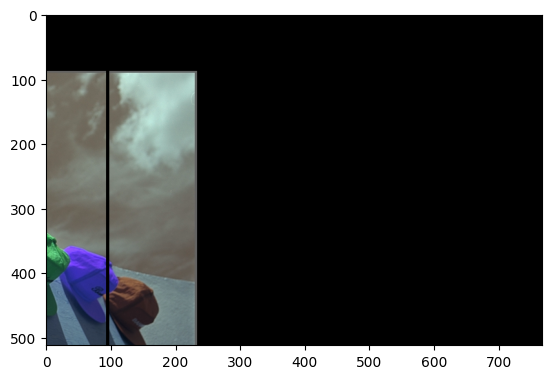

In [ ]:
import cv2
import numpy as np
from scipy.spatial import distance
from skimage.measure import regionprops, label
from skimage import exposure

def extract_contours(image):
    # Convert to binary image
    _, binary = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours

def compute_shape_context(contour):
    # Extract x, y coordinates of the contour points
    points = np.array([p[0] for p in contour])
    center = np.mean(points, axis=0)

    # Calculate distances and angles
    distances = np.linalg.norm(points - center, axis=1)
    angles = np.arctan2(points[:, 1] - center[1], points[:, 0] - center[0])

    # Create shape context histogram
    num_bins_r = 3  # Radial bins
    num_bins_theta = 6  # Angular bins
    r_bins = np.linspace(0, np.max(distances), num_bins_r + 1)
    theta_bins = np.linspace(-np.pi, np.pi, num_bins_theta + 1)

    hist, _, _ = np.histogram2d(
        np.digitize(distances, r_bins) - 1,
        np.digitize(angles, theta_bins) - 1,
        bins=[num_bins_r, num_bins_theta]
    )

    return hist.flatten()

def shape_context_similarity(hist1, hist2):
    # Calculate the similarity between two shape context histograms
    return np.sum((hist1 - hist2) ** 2) / (hist1 + hist2 + 1e-6)

def align_images(template_image, sample_image):
    # Convert images to grayscale
    if len(sample_image.shape) == 3:
        sample_gray = cv2.cvtColor(sample_image, cv2.COLOR_BGR2GRAY)
    else:
        sample_gray = sample_image

    if len(template_image.shape) == 3:
        template_gray = cv2.cvtColor(template_image, cv2.COLOR_BGR2GRAY)
    else:
        template_gray = template_image


    # Extract contours
    template_contours = extract_contours(template_gray)
    sample_contours = extract_contours(sample_gray)

    # Assume we take the largest contour for alignment
    template_contour = max(template_contours, key=cv2.contourArea)
    sample_contour = max(sample_contours, key=cv2.contourArea)

    # Compute shape context for both contours
    template_hist = compute_shape_context(template_contour)
    sample_hist = compute_shape_context(sample_contour)

    # Calculate similarity
    similarity = shape_context_similarity(template_hist, sample_hist)
    print(f"Shape Context Similarity: {similarity}")

    # Find the optimal transformation using OpenCV's matchShapes (as a simple approach)
    _, _, _, best_match_idx = cv2.minMaxLoc(cv2.matchShapes(template_contour, sample_contour, cv2.CONTOURS_MATCH_I1, 0))

    # Estimate rotation, translation based on contour matching (simple approximation)
    template_moments = cv2.moments(template_contour)
    sample_moments = cv2.moments(sample_contour)

    # Centroid of the template
    cx_template = int(template_moments['m10'] / template_moments['m00'])
    cy_template = int(template_moments['m01'] / template_moments['m00'])

    # Centroid of the sample
    cx_sample = int(sample_moments['m10'] / sample_moments['m00'])
    cy_sample = int(sample_moments['m01'] / sample_moments['m00'])

    # Translation vector
    tx = cx_template - cx_sample
    ty = cy_template - cy_sample

    # Create a translation matrix and apply it to the sample image
    translation_matrix = np.float32([[1, 0, tx], [0, 1, ty]])
    aligned_image = cv2.warpAffine(sample_image, translation_matrix, (sample_image.shape[1], sample_image.shape[0]))

    return aligned_image

# Usage example:
sample_image = ndimage.rotate(Image.open(defect1), 0)
template_image = np.asarray(golden_image.get_template_image())

aligned_image = align_images(template_image, sample_image)

# Show results
plt.imshow(cv2.cvtColor(aligned_image, cv2.COLOR_BGR2RGB))

## Fast photometric image alignment algorithm with row and column means

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def mean_xy(img):
    # Similar implementation as provided in your algorithm
    ny, nx = img.shape
    xrange = np.arange(nx)
    yrange = np.arange(ny)
    mean_x0 = img.mean(axis=0)
    mean_y0 = img.mean(axis=1)
    xc = np.polyfit(xrange, mean_x0, 2)
    yc = np.polyfit(yrange, mean_y0, 2)
    xres = mean_x0 - np.polyval(xc, xrange)
    yres = mean_y0 - np.polyval(yc, yrange)
    xresmed, xresstd = np.median(xres), np.std(xres)
    yresmed, yresstd = np.median(yres), np.std(yres)
    xsky = np.where(np.abs(xres - xresmed) < 3 * xresstd)[0]
    ysky = np.where(np.abs(yres - yresmed) < 3 * yresstd)[0]
    xc2 = np.polyfit(xrange[xsky], mean_x0[xsky], 2)
    yc2 = np.polyfit(yrange[ysky], mean_y0[ysky], 2)
    mean_x = mean_x0 / np.polyval(xc2, xrange)
    mean_y = mean_y0 / np.polyval(yc2, yrange)
    return mean_x, mean_y

def mean_offset1d(m1, m2, max_d=250, con_w=25, prec=1, with_std=False):
    n1, n2 = len(m1), len(m2)

    def offset_div(i):
        if -n2 < i < n1:
            d = m1[max(0, i):min(n1, n2+i)] / m2[max(0, -i):min(n1-i, n2)]
            if np.any(np.isnan(d)):  # Check for NaNs
                return 1.0  # Assign a high value to avoid NaN issues
            dm = np.mean(d)
            return np.std(d / dm) if dm != 0 else 1.0
        return 1.0

    con_w2 = con_w // 2
    divstd = np.array([offset_div(i) for i in range(-max_d, max_d+1)])

    # Handle cases where divstd could be NaN
    if np.all(np.isnan(divstd)):
        raise ValueError("All values in divstd are NaN, check your input means.")

    # Smooth and normalize the divstd
    core = np.ones(con_w) / con_w
    smoothed = np.convolve(divstd, core, mode="same")
    smoothed[:con_w2] = np.nan
    smoothed[-con_w2:] = np.nan
    divstd1 = divstd / smoothed

    # Check if divstd1 contains NaN
    if np.all(np.isnan(divstd1)):
        raise ValueError("All values in divstd1 are NaN after smoothing.")

    p = np.nanargmin(divstd1) - max_d

    # Additional precision handling
    if prec < 1:
        m1 = np.interp(np.arange(0, n1, prec), np.arange(n1), m1)
        m2 = np.interp(np.arange(0, n2, prec), np.arange(n2), m2)
        n1, n2 = len(m1), len(m2)
        ppr = int(round(p / prec))
        near_d = int(round(3 / prec))
        divstd_prec = np.array([offset_div(i) for i in range(ppr-near_d, ppr+near_d+1)])

        pp = np.nanargmin(divstd_prec)
        p = (pp - near_d) * prec + p

    return (p, divstd, divstd1) if with_std else p


def align_images(template_image, sample_image):
    template_mean_x, template_mean_y = mean_xy(template_image)
    sample_mean_x, sample_mean_y = mean_xy(sample_image)

    # Find offsets for both axes
    offset_x = mean_offset1d(template_mean_x, sample_mean_x)
    offset_y = mean_offset1d(template_mean_y, sample_mean_y)

    print(f"Offset X: {offset_x}, Offset Y: {offset_y}")

    # Create a translation matrix for the offsets
    translation_matrix = np.float32([[1, 0, offset_x], [0, 1, offset_y]])
    aligned_image = cv2.warpAffine(sample_image, translation_matrix, (sample_image.shape[1], sample_image.shape[0]))

    return aligned_image

## Parametization trial of original ORB registration

In [ ]:
# Image alignment using ORB
# Ref: https://pyimagesearch.com/2020/08/31/image-alignment-and-registration-with-opencv/

def align_images(image, template, maxFeatures=500, keepPercent=0.2, debug=False):
    # Convert both the input image and template to grayscale
    if len(image.shape) == 3:
        imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        imageGray = image

    if len(template.shape) == 3:
        templateGray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
    else:
        templateGray = template

    # Use ORB to detect keypoints and extract (binary) local invariant features
    orb = cv2.ORB_create(maxFeatures)
    (kpsA, descsA) = orb.detectAndCompute(imageGray, None)
    (kpsB, descsB) = orb.detectAndCompute(templateGray, None)

    # Match the features
    method = cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING
    matcher = cv2.DescriptorMatcher_create(method)
    matches = matcher.match(descsA, descsB, None)

    # Sort the matches by their distance (the smaller the distance, the "more similar" the features are)
    matches = sorted(matches, key=lambda x: x.distance)

    # Keep only the top matches
    keep = int(len(matches) * keepPercent)
    matches = matches[:keep]

    # Check to see if we should visualize the matched keypoints
    if debug:
        matchedVis = cv2.drawMatches(image, kpsA, template, kpsB, matches, None)
        matchedVis = imutils.resize(matchedVis, width=1000)
        cv2_imshow(matchedVis)

    # Allocate memory for the keypoints (x, y)-coordinates from the top matches
    # We'll use these coordinates to compute our homography matrix
    ptsA = np.zeros((len(matches), 2), dtype="float")
    ptsB = np.zeros((len(matches), 2), dtype="float")

    # Loop over the top matches
    for (i, m) in enumerate(matches):
        # Indicate that the two keypoints in the respective images map to each other
        ptsA[i] = kpsA[m.queryIdx].pt
        ptsB[i] = kpsB[m.trainIdx].pt

    # Compute the homography matrix between the two sets of matched points
    (H, mask) = cv2.findHomography(ptsA, ptsB, method=cv2.RANSAC)

    # Use the homography matrix to align the images
    (h, w) = template.shape[:2]
    aligned = cv2.warpPerspective(image, H, (w, h))

    # Return the aligned image
    return aligned


In [ ]:
defect1_img = Image.open(defect1)
rotated = ndimage.rotate(sample, -0.5)
default_maxFeatures = 500
default_keepPercent = 0.2
template_image = np.asarray(golden_image.get_template_image())
all_sims = []

for features in range(100, 2000, 50):
  for keep in np.arange(0.1, 1, 0.1):
    fixed = align_images(rotated, np.asarray(golden_image.get_template_image()), maxFeatures=features, keepPercent=keep)
    similarity = register_images(fixed, template_image)
    print(f"Max Features:{features}\tKeep Percent:{keep:.2f}\tShape similarity score: {similarity}")
    all_sims.append(similarity)

"""plt.figure(figsize=(14,8))
plt.subplot(1,2,1)
plt.imshow(defect1_img)

plt.subplot(1,2,2)
plt.imshow(fixed)

plt.tight_layout()
plt.show()"""

Max Features:100	Keep Percent:0.10	Shape similarity score: 2142.013485972155
Max Features:100	Keep Percent:0.20	Shape similarity score: 4032.0423122319016
Max Features:100	Keep Percent:0.30	Shape similarity score: 4075.541840850362
Max Features:100	Keep Percent:0.40	Shape similarity score: 1.4999985000015001
Max Features:100	Keep Percent:0.50	Shape similarity score: 4188.517029546343
Max Features:100	Keep Percent:0.60	Shape similarity score: 4231.010100847195
Max Features:100	Keep Percent:0.70	Shape similarity score: 3843.259452284907
Max Features:100	Keep Percent:0.80	Shape similarity score: 4854.0079938484805
Max Features:100	Keep Percent:0.90	Shape similarity score: 6083.685046349723
Max Features:150	Keep Percent:0.10	Shape similarity score: 1241.677244632221
Max Features:150	Keep Percent:0.20	Shape similarity score: 1.1666656111121296
Max Features:150	Keep Percent:0.30	Shape similarity score: 2942.5075708886543
Max Features:150	Keep Percent:0.40	Shape similarity score: 3608.5167257

KeyboardInterrupt: 

[335.23868132 336.279478   340.59665332 353.16750236 355.00663795
 355.07627398 355.90244425 356.82196362 356.92073869 356.94941462]
389.6946239079189


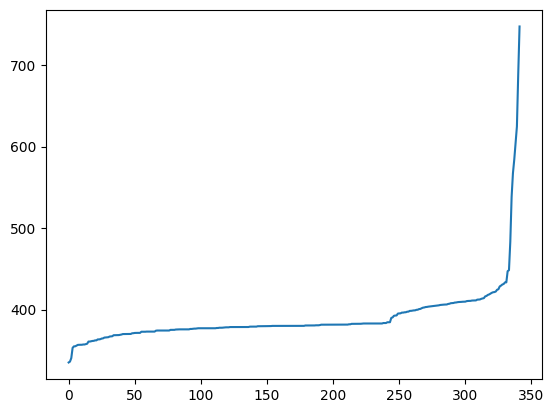

In [ ]:
plt.plot(np.sort(all_sims))
print(np.sort(all_sims)[:10])
print(np.mean(all_sims))
# Max Features:1300	Keep Percent:0.40	Shape similarity score: 299.86339973061115

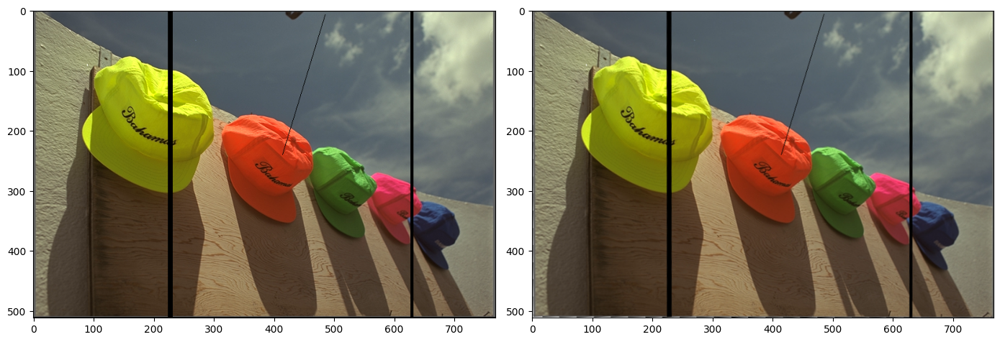

In [ ]:
defect1_img = Image.open(defect1)
rotated = ndimage.rotate(sample, -0.5)
default_maxFeatures = 500
default_keepPercent = 0.2
template_image = np.asarray(golden_image.get_template_image())

fixed = align_images(rotated, np.asarray(golden_image.get_template_image()), maxFeatures=1300, keepPercent=0.4)

plt.figure(figsize=(14,8))
plt.subplot(1,2,1)
plt.imshow(defect1_img)

plt.subplot(1,2,2)
plt.imshow(fixed)

plt.tight_layout()
plt.show()

## Revised Image Registration Algorithm

In [ ]:
import cv2
import numpy as np
import imutils  # Make sure to have imutils installed for resizing images

def align_images(image, template, maxFeatures=500, keepPercent=0.2, debug=False):
    # Convert both the input image and template to grayscale
    if len(image.shape) == 3:
        imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        imageGray = image

    if len(template.shape) == 3:
        templateGray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
    else:
        templateGray = template

    # Use SIFT to detect keypoints and extract features
    sift = cv2.SIFT_create(maxFeatures)
    (kpsA, descsA) = sift.detectAndCompute(imageGray, None)
    (kpsB, descsB) = sift.detectAndCompute(templateGray, None)

    # Match the features using FLANN
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)  # or pass empty dictionary

    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(descsA, descsB, k=2)

    # Apply the ratio test to filter good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:  # Lowe's ratio test
            good_matches.append(m)

    # Keep only the top matches
    keep = int(len(good_matches) * keepPercent)
    good_matches = good_matches[:keep]

    # Check to see if we should visualize the matched keypoints
    if debug:
        matchedVis = cv2.drawMatches(image, kpsA, template, kpsB, good_matches, None)
        matchedVis = imutils.resize(matchedVis, width=1000)
        cv2_imshow(matchedVis)

    # Allocate memory for the keypoints (x, y)-coordinates from the good matches
    ptsA = np.zeros((len(good_matches), 2), dtype="float")
    ptsB = np.zeros((len(good_matches), 2), dtype="float")

    # Loop over the good matches
    for (i, m) in enumerate(good_matches):
        # Indicate that the two keypoints in the respective images map to each other
        ptsA[i] = kpsA[m.queryIdx].pt
        ptsB[i] = kpsB[m.trainIdx].pt

    # Compute the homography matrix between the two sets of matched points
    (H, mask) = cv2.findHomography(ptsA, ptsB, method=cv2.RANSAC)

    # Use the homography matrix to align the images
    (h, w) = template.shape[:2]
    aligned = cv2.warpPerspective(image, H, (w, h))

    # Return the aligned image
    return aligned


# Version 1.5

In [ ]:
# Version 1.5
# Changes: Utilized revised Image Registration algorithm that used SIFT instead of ORB
# and used FLANN matching instead of brute force matching. Also utilized hyperparametized parameters
# Problems: Closer to ideal, but still far from perfect, still shows false positives in larger variants

def get_marked_image(image_src, kernel_size, rotation=0, ideal=True):
    sample = np.asarray(image_src)

    # Rotate and align the sample image if necessary
    if ideal:
        fixed = sample
    else:
        rotated = ndimage.rotate(sample, rotation)
        fixed = align_images(rotated, np.asarray(golden_image.get_template_image()), maxFeatures=750, keepPercent=0.1)
        #Max Features:750	Keep Percent:0.10

    # Load and convert sample image to grayscale
    sample_image_gray = np.array(Image.fromarray(fixed).convert("L"), dtype=np.float32)

    # Apply Gaussian blur to reduce noise
    sample_image_blur = cv2.GaussianBlur(sample_image_gray, (kernel_size, kernel_size), 0)

    # Create blurred versions of the light and dark images
    dark_blur = cv2.GaussianBlur(golden_image.dark, (kernel_size, kernel_size), 0)
    light_blur = cv2.GaussianBlur(golden_image.light, (kernel_size, kernel_size), 0)

    # Apply morphological operations: dilation on light image and erosion on dark image
    light_dilated = cv2.dilate(light_blur, np.ones((3, 3), np.uint8))
    dark_eroded = cv2.erode(dark_blur, np.ones((3, 3), np.uint8))

    # Find the pixels that are not within the threshold range using dilated light and eroded dark images
    out_of_range = np.logical_or(sample_image_blur < dark_eroded, sample_image_blur > light_dilated)

    # Optionally: Apply morphological operations to refine the result (remove isolated noise)
    out_of_range = cv2.morphologyEx(out_of_range.astype(np.uint8), cv2.MORPH_OPEN, np.ones((3, 3), np.uint8))

    # Create a binary mask where defective pixels are white (255) and others are black (0)
    binary_defect_image = np.zeros_like(sample_image_gray, dtype=np.uint8)
    binary_defect_image[out_of_range == 1] = 255  # Set defective pixels to white

    # Convert the binary mask to an image
    binary_image = Image.fromarray(binary_defect_image)

    return binary_image

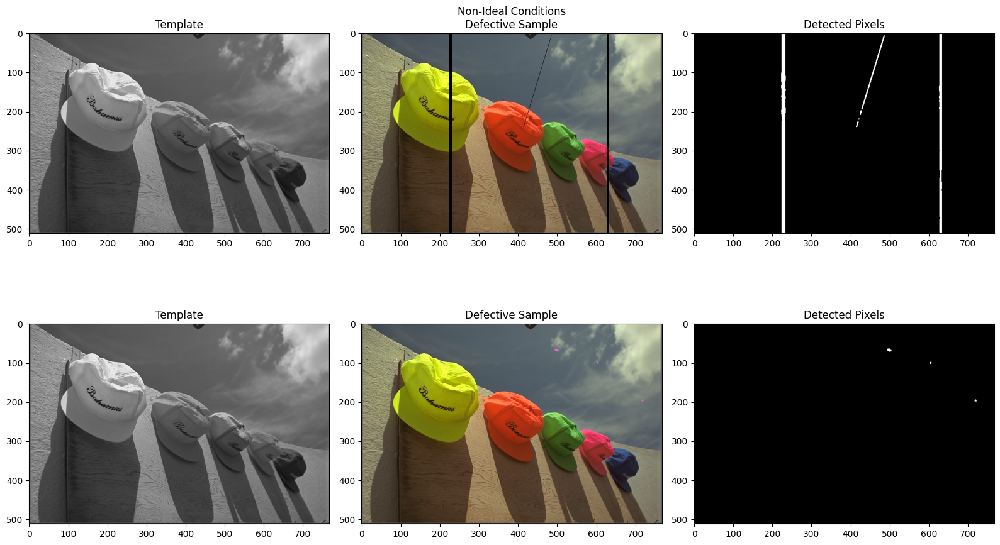

In [ ]:
defect1 = '/content/KODAK defect 2.png'
defect2 = '/content/KODAK defect 3.png'

defect1_img = Image.open(defect1)
defect2_img = Image.open(defect2)
marked_defect1 = get_marked_image(defect1_img, kernel_size=5,ideal=False,rotation=-2)
marked_defect2 = get_marked_image(defect2_img, kernel_size=5,ideal=False,rotation=-2)

plt.figure(figsize=(16,10))

plt.subplot(2,3,1)
plt.imshow(golden_image.get_template_image().convert("RGB"))
plt.title("Template")

plt.subplot(2,3,2)
plt.imshow(defect1_img)
plt.title("Non-Ideal Conditions\nDefective Sample")

plt.subplot(2,3,3)
plt.imshow(marked_defect1, cmap="gray")
plt.title("Detected Pixels")

plt.subplot(2,3,4)
plt.imshow(golden_image.get_template_image().convert("RGB"))
plt.title("Template")

plt.subplot(2,3,5)
plt.imshow(defect2_img)
plt.title("Defective Sample")

plt.subplot(2,3,6)
plt.imshow(marked_defect2, cmap="gray")
plt.title("Detected Pixels")

plt.tight_layout()
plt.show()

# Version 1.6

In [ ]:
import time

def get_marked_image(image_src, kernel_size, rotation=0, ideal=True):
    # Initialize a dictionary to store the time taken for each step
    timings = {}

    # Start timer for the initial sample conversion
    start = time.time()
    sample = np.asarray(image_src)
    timings["Convert sample to array"] = time.time() - start

    # Rotate and align the sample image if necessary
    start = time.time()
    if ideal:
        fixed = sample
    else:
        rotated = ndimage.rotate(sample, rotation)
        fixed = align_images(rotated, np.asarray(golden_image.get_template_image()))
        #, maxFeatures=750, keepPercent=0.1
    timings["Image rotation and alignment"] = time.time() - start

    # Convert to grayscale
    start = time.time()
    sample_image_gray = np.array(Image.fromarray(fixed).convert("L"), dtype=np.float32)
    timings["Convert to grayscale"] = time.time() - start

    # Apply Gaussian blur
    start = time.time()
    sample_image_blur = cv2.GaussianBlur(sample_image_gray, (kernel_size, kernel_size), 0)
    timings["Gaussian blur on sample image"] = time.time() - start

    # Blurred versions of light and dark images
    start = time.time()
    dark_blur = cv2.GaussianBlur(golden_image.dark, (kernel_size, kernel_size), 0)
    light_blur = cv2.GaussianBlur(golden_image.light, (kernel_size, kernel_size), 0)
    timings["Gaussian blur on light and dark images"] = time.time() - start

    # Dilation and erosion operations
    start = time.time()
    light_dilated = cv2.dilate(light_blur, np.ones((3, 3), np.uint8))
    dark_eroded = cv2.erode(dark_blur, np.ones((3, 3), np.uint8))
    timings["Dilation and erosion"] = time.time() - start

    # Threshold range detection
    start = time.time()
    out_of_range = np.logical_or(sample_image_blur < dark_eroded, sample_image_blur > light_dilated)
    timings["Threshold range detection"] = time.time() - start

    # Morphological opening to remove noise
    start = time.time()
    out_of_range = cv2.morphologyEx(out_of_range.astype(np.uint8), cv2.MORPH_OPEN, np.ones((3, 3), np.uint8))
    timings["Morphological opening"] = time.time() - start

    # Create binary defect mask
    start = time.time()
    binary_defect_image = np.zeros_like(sample_image_gray, dtype=np.uint8)
    binary_defect_image[out_of_range == 1] = 255
    timings["Binary mask creation"] = time.time() - start

    # Convert to image format
    start = time.time()
    binary_image = Image.fromarray(binary_defect_image)
    timings["Convert binary mask to image"] = time.time() - start

    # Output timing information

    return binary_image

# Test with camera


In [ ]:
def defect_criteria(mask, max = 0.01):
  defect_pixel_count = np.sum(np.asarray(mask) == 255)
  w, h = mask.size
  ratio = defect_pixel_count / (w*h)
  is_defective = ratio > max
  return [is_defective, ratio]

In [ ]:
image_paths = ['/content/template.png']
golden_image = Template(image_paths, a=100, b=300)

plt.figure(figsize=(20,10))

plt.subplot(1,3,1)
plt.imshow(golden_image.get_light_image(), cmap='gray')
plt.title("Light")

plt.subplot(1,3,2)
plt.imshow(golden_image.get_template_image(), cmap='gray')
plt.title("Template")

plt.subplot(1,3,3)
plt.imshow(golden_image.get_dark_image(), cmap='gray')
plt.title("Dark")

NameError: name 'Template' is not defined

Convert sample to array: 0.5015 seconds
Image rotation and alignment: 15.8461 seconds
Convert to grayscale: 0.0629 seconds
Gaussian blur on sample image: 0.0975 seconds
Gaussian blur on light and dark images: 0.2018 seconds
Dilation and erosion: 0.1699 seconds
Threshold range detection: 0.0440 seconds
Morphological opening: 0.0188 seconds
Binary mask creation: 0.0184 seconds
Convert binary mask to image: 0.0002 seconds
0.05833148828765
True


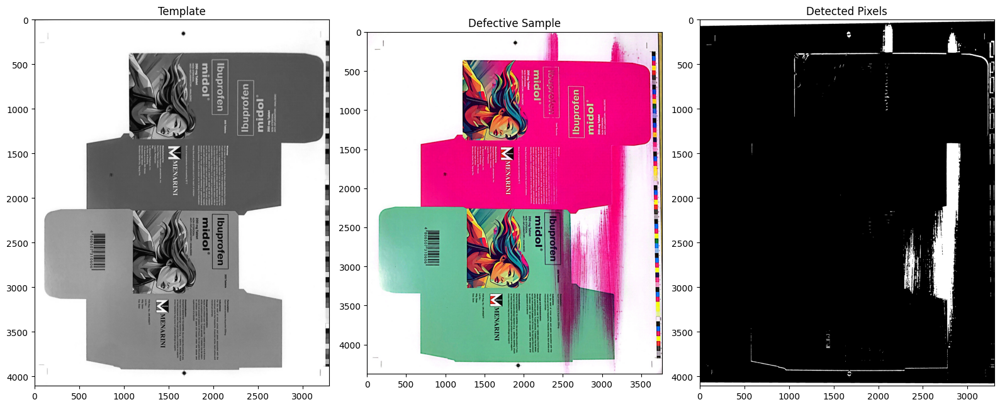

In [ ]:
defective = '/content/defect.png'

defect1_img = Image.open(defective)
marked_defect = get_marked_image(defect1_img, kernel_size=5,ideal=False,rotation=(-0.5))

print(defect_criteria(marked_defect))

plt.figure(figsize=(16,10))

plt.subplot(1,3,1)
plt.imshow(golden_image.get_template_image().convert("RGB"))
plt.title("Template")

plt.subplot(1,3,2)
plt.imshow(defect1_img)
plt.title("Defective Sample")

plt.subplot(1,3,3)
plt.imshow(marked_defect, cmap="gray")
plt.title("Detected Pixels")

plt.tight_layout()
plt.show()

Image 1: True 	Actual: True	Ratio: 5.523225435061772%
Image 2: True 	Actual: True	Ratio: 0.12279148031705264%
Image 3: False 	Actual: True	Ratio: 0.0%
Image 4: False 	Actual: False	Ratio: 0.0%
Image 5: True 	Actual: True	Ratio: 0.36234483165803183%
Image 6: False 	Actual: False	Ratio: 0.0%


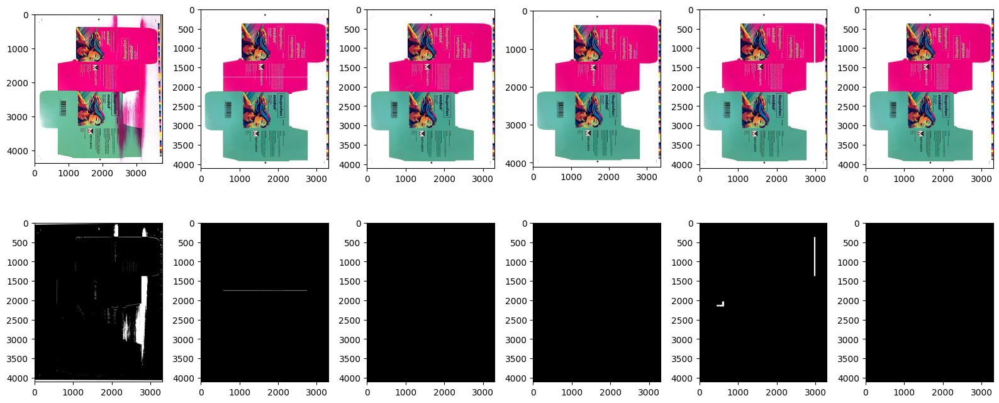

In [ ]:
image1 = '/content/defect.png'  # Defective
image2 = '/content/defect 1.png'# Defective
image3 = '/content/defect 2.png'# Defective
image4 = '/content/good 1.png'  # Good
image5 = '/content/defect 3.png'# Defective
image6 = '/content/template.png'# Good
images = [image1, image2, image3, image4, image5, image6]
actual = [True, True, True, False, True, False]

plt.figure(figsize=(16,7))

for i in range(6):
  defect1_img = Image.open(images[i])
  marked_defect = get_marked_image(defect1_img, kernel_size=5,ideal=False)
  result, ratio = defect_criteria(marked_defect, max=0.001)
  print(f"Image {i+1}: {result} \tActual: {actual[i]}\tRatio: {ratio*100}%")
  plt.subplot(2,6,i+1)
  plt.imshow(defect1_img)
  plt.subplot(2,6,i+7)
  plt.imshow(marked_defect, cmap="gray")

plt.tight_layout()
plt.show()